In [ ]:
!pip install stockstats
!pip install curl_cffi
!pip install u8darts[all] pygwalker -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.4/57.4 kB 517.4 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.3/46.3 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 956.2/956.2 kB 9.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.2/100.2 kB 8.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 200.6/200.6 kB 18.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.1/823.1 kB 25.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 354.4/354.4 kB 19.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.2/87.2 kB 9.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 21.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2

In [ ]:
import pandas as pd
import yfinance as yf
from stockstats import wrap, unwrap
import numpy as np
import holidays
from curl_cffi import requests

START_DATE = "2015-01-01"
END_DATE = "2024-12-31"

ibex35_tickers = [
    "^IBEX",
    "SAN.MC",  # Banco Santander
    "BBVA.MC",  # BBVA
    "ITX.MC",  # Inditex
    "REP.MC",  # Repsol
    "IBE.MC",  # Iberdrola
    "TEF.MC",  # Telefónica
    "FER.MC",  # Ferrovial
    "ACS.MC",  # ACS
    "AENA.MC",  # AENA
    "AMS.MC", # Amadeus
    "CABK.MC", # CaixaBank
    "CLNX.MC", # Cellnex Telecom
    "IAG.MC", # IAG
    "RED.MC",
    "ELE.MC",
    "SAB.MC",
    "BKT.MC",
    "ANA.MC",
    "NTGY.MC",
    "GRF.MC",
    "ENG.MC",
    "MRL.MC",
    "MAP.MC",
    "MTS.MC",
    "FDR.MC",
    "LOG.MC",
    "IDR.MC",
    "ACX.MC",
    "COL.MC",
    "UNI.MC",
    "SCYR.MC",
    "ANE.MC",
    "ROVI.MC",
    "SLR.MC",
    "MEL.MC"
]

session = requests.Session(impersonate="chrome")
# Descarga del índice IBEX 35
ibex_index = yf.download("^IBEX", start=START_DATE, end=END_DATE, session=session)
ibex_index = ibex_index[["Close", "Volume"]].rename(columns={"Close": "ibex_close", "Volume": "ibex_volume"})
ibex_index.reset_index(inplace=True)
ibex_index["Date"] = pd.to_datetime(ibex_index["Date"])

total_df = pd.DataFrame()
# Función para obtener indicadores por ticker
for ticker in ibex35_tickers:
    stock = yf.Ticker(ticker, session=session)
    data = stock.history(start=START_DATE, end=END_DATE)
    data['Ticker'] = ticker
    data = wrap(data)
    _ = data[['volume','macd', 'boll_ub', 'boll_lb', 'rsi_30', 'cci_30', 'dx_30', 'close_30_sma', 'close_60_sma']]
    data = unwrap(data)
    data.fillna(0, inplace=True)
    data.replace(np.inf, 0, inplace=True)
    total_df = total_df._append(data)

# Pivotear para una fila por fecha (features por ticker)
total_df = total_df.drop(columns=["open", "high", "low", "Dividends", "Stock Splits", "macds", "macdh", "boll"])
total_df = total_df.reset_index()
pivoted_data = total_df.pivot(index="Date", columns="Ticker")
pivoted_data.columns = ["_".join(col).lower().replace(".mc","").replace("^","") for col in pivoted_data.columns]
pivoted_data.reset_index(inplace=True)

# Añadir columna con el valor real del IBEX 35
ibex_index.columns = ibex_index.columns.get_level_values(0)
ibex_index['Date'] = ibex_index['Date'].dt.tz_localize(None)
pivoted_data['Date'] = pivoted_data['Date'].dt.tz_localize(None)
dataset = pivoted_data.merge(ibex_index, on="Date", how="inner")

ibex_weights_dict = {
    "SAN.MC": 12.01,
    "BBVA.MC": 9.48,
    "ITX.MC": 13.03,
    "REP.MC": 3.78,
    "IBE.MC": 14.27,
    "TEF.MC": 4.49,
    "FER.MC": 4.43,
    "ACS.MC": 2.03,
    "AENA.MC": 	3.51,
    "AMS.MC": 5.19,
    "CABK.MC": 4.93,
    "CLNX.MC": 4.19,
    "IAG.MC": 1.76,
    "RED.MC": 1.70, # Redeia
    "ELE.MC": 1.61, # Endesa
    "SAB.MC": 1.41, # Sabadell
    "BKT.MC": 1.15, # Bankinter
    "ANA.MC": 1.12, # Acciona
    "NTGY.MC": 1.11, # Naturgy
    "GRF.MC": 0.97, # Grifoils
    "ENG.MC": 0.89, # Enagás
    "MRL.MC": 0.79, # Merlin Prop
    "MAP.MC": 0.78, # Mapfre
    "MTS.MC": 0.76, # ArcelorMittal
    "FDR.MC": 0.55, # Fluidra
    "LOG.MC": 0.53, # Logista
    "IDR.MC": 0.50, # Indra
    "ACX.MC": 0.49, # Acerinox
    "COL.MC": 0.49, # Imob Colonial
    "UNI.MC": 0.45, # Unicaja
    "SCYR.MC": 0.40, # Sacyr
    "ANE.MC": 0.36, # Acciona Energia
    "ROVI.MC": 0.35, # Lab Rovi
    "SLR.MC": 0.30, # Solaria
    "MEL.MC": 0.20 # Melia
}

for ticker, weight in ibex_weights_dict.items():
  dataset[f'{ticker.replace(".", "_").lower().replace("_mc","")}_weight'] = weight

# Añadir columna de festivo en España
es_holidays = holidays.Spain()
dataset["is_holiday"] = dataset["Date"].apply(lambda x: x in es_holidays)

dataset["day_of_week"] = dataset["Date"].dt.dayofweek
dataset["month"] = dataset["Date"].dt.month
dataset["quarter"] = dataset["Date"].dt.quarter
dataset["year"] = dataset["Date"].dt.year
dataset["trading_day"] = dataset.groupby(dataset["Date"].dt.to_period("M")).cumcount() + 1

dataset = dataset.drop(columns=["close_ibex", "volume_ibex"])

# Mostrar muestra del dataset final
pd.set_option('display.max_columns', None)
dataset.head()


<ipython-input-2-2240756557>:54: FutureWarning: YF.download() has changed argument auto_adjust default to True
  ibex_index = yf.download("^IBEX", start=START_DATE, end=END_DATE, session=session)
[*********************100%***********************]  1 of 1 completed


,Date,close_acs,close_acx,close_aena,close_ams,close_ana,close_ane,close_bbva,close_bkt,close_cabk,close_clnx,close_col,close_ele,close_eng,close_fdr,close_fer,close_grf,close_iag,close_ibe,close_idr,close_itx,close_log,close_map,close_mel,close_mrl,close_mts,close_ntgy,close_red,close_rep,close_rovi,close_sab,close_san,close_scyr,close_slr,close_tef,close_uni,volume_acs,volume_acx,volume_aena,volume_ams,volume_ana,volume_ane,volume_bbva,volume_bkt,volume_cabk,volume_clnx,volume_col,volume_ele,volume_eng,volume_fdr,volume_fer,volume_grf,volume_iag,volume_ibe,volume_idr,volume_itx,volume_log,volume_map,volume_mel,volume_mrl,volume_mts,volume_ntgy,volume_red,volume_rep,volume_rovi,volume_sab,volume_san,volume_scyr,volume_slr,volume_tef,volume_uni,macd_acs,macd_acx,macd_aena,macd_ams,macd_ana,macd_ane,macd_bbva,macd_bkt,macd_cabk,macd_clnx,macd_col,macd_ele,macd_eng,macd_fdr,macd_fer,macd_grf,macd_iag,macd_ibe,macd_idr,macd_itx,macd_log,macd_map,macd_mel,macd_mrl,macd_mts,macd_ntgy,macd_red,macd_rep,macd_rovi,macd_sab,macd_san,macd_scyr,macd_slr,macd_tef,macd_uni,macd_ibex,boll_ub_acs,boll_ub_acx,boll_ub_aena,boll_ub_ams,boll_ub_ana,boll_ub_ane,boll_ub_bbva,boll_ub_bkt,boll_ub_cabk,boll_ub_clnx,boll_ub_col,boll_ub_ele,boll_ub_eng,boll_ub_fdr,boll_ub_fer,boll_ub_grf,boll_ub_iag,boll_ub_ibe,boll_ub_idr,boll_ub_itx,boll_ub_log,boll_ub_map,boll_ub_mel,boll_ub_mrl,boll_ub_mts,boll_ub_ntgy,boll_ub_red,boll_ub_rep,boll_ub_rovi,boll_ub_sab,boll_ub_san,boll_ub_scyr,boll_ub_slr,boll_ub_tef,boll_ub_uni,boll_ub_ibex,boll_lb_acs,boll_lb_acx,boll_lb_aena,boll_lb_ams,boll_lb_ana,boll_lb_ane,boll_lb_bbva,boll_lb_bkt,boll_lb_cabk,boll_lb_clnx,boll_lb_col,boll_lb_ele,boll_lb_eng,boll_lb_fdr,boll_lb_fer,boll_lb_grf,boll_lb_iag,boll_lb_ibe,boll_lb_idr,boll_lb_itx,boll_lb_log,boll_lb_map,boll_lb_mel,boll_lb_mrl,boll_lb_mts,boll_lb_ntgy,boll_lb_red,boll_lb_rep,boll_lb_rovi,boll_lb_sab,boll_lb_san,boll_lb_scyr,boll_lb_slr,boll_lb_tef,boll_lb_uni,boll_lb_ibex,rsi_30_acs,rsi_30_acx,rsi_30_aena,rsi_30_ams,rsi_30_ana,rsi_30_ane,rsi_30_bbva,rsi_30_bkt,rsi_30_cabk,rsi_30_clnx,rsi_30_col,rsi_30_ele,rsi_30_eng,rsi_30_fdr,rsi_30_fer,rsi_30_grf,rsi_30_iag,rsi_30_ibe,rsi_30_idr,rsi_30_itx,rsi_30_log,rsi_30_map,rsi_30_mel,rsi_30_mrl,rsi_30_mts,rsi_30_ntgy,rsi_30_red,rsi_30_rep,rsi_30_rovi,rsi_30_sab,rsi_30_san,rsi_30_scyr,rsi_30_slr,rsi_30_tef,rsi_30_uni,rsi_30_ibex,cci_30_acs,cci_30_acx,cci_30_aena,cci_30_ams,cci_30_ana,cci_30_ane,cci_30_bbva,cci_30_bkt,cci_30_cabk,cci_30_clnx,cci_30_col,cci_30_ele,cci_30_eng,cci_30_fdr,cci_30_fer,cci_30_grf,cci_30_iag,cci_30_ibe,cci_30_idr,cci_30_itx,cci_30_log,cci_30_map,cci_30_mel,cci_30_mrl,cci_30_mts,cci_30_ntgy,cci_30_red,cci_30_rep,cci_30_rovi,cci_30_sab,cci_30_san,cci_30_scyr,cci_30_slr,cci_30_tef,cci_30_uni,cci_30_ibex,dx_30_acs,dx_30_acx,dx_30_aena,dx_30_ams,dx_30_ana,dx_30_ane,dx_30_bbva,dx_30_bkt,dx_30_cabk,dx_30_clnx,dx_30_col,dx_30_ele,dx_30_eng,dx_30_fdr,dx_30_fer,dx_30_grf,dx_30_iag,dx_30_ibe,dx_30_idr,dx_30_itx,dx_30_log,dx_30_map,dx_30_mel,dx_30_mrl,dx_30_mts,dx_30_ntgy,dx_30_red,dx_30_rep,dx_30_rovi,dx_30_sab,dx_30_san,dx_30_scyr,dx_30_slr,dx_30_tef,dx_30_uni,dx_30_ibex,close_30_sma_acs,close_30_sma_acx,close_30_sma_aena,close_30_sma_ams,close_30_sma_ana,close_30_sma_ane,close_30_sma_bbva,close_30_sma_bkt,close_30_sma_cabk,close_30_sma_clnx,close_30_sma_col,close_30_sma_ele,close_30_sma_eng,close_30_sma_fdr,close_30_sma_fer,close_30_sma_grf,close_30_sma_iag,close_30_sma_ibe,close_30_sma_idr,close_30_sma_itx,close_30_sma_log,close_30_sma_map,close_30_sma_mel,close_30_sma_mrl,close_30_sma_mts,close_30_sma_ntgy,close_30_sma_red,close_30_sma_rep,close_30_sma_rovi,close_30_sma_sab,close_30_sma_san,close_30_sma_scyr,close_30_sma_slr,close_30_sma_tef,close_30_sma_uni,close_30_sma_ibex,close_60_sma_acs,close_60_sma_acx,close_60_sma_aena,close_60_sma_ams,close_60_sma_ana,close_60_sma_ane,close_60_sma_bbva,close_60_sma_bkt,close_60_sma_cabk,close_60_sma_clnx,close_60_sma_col,close_60_sma_ele,close_60_sma_eng,close_60_sma

In [ ]:
# Print a single instance
pd.set_option('display.max_rows',None)
print(dataset.iloc[1000])

Date                 2018-11-28 00:00:00
close_acs                      21.861019
close_acx                       6.129192
close_aena                    115.381599
close_ams                      60.311932
close_ana                      66.760178
close_ane                            NaN
close_bbva                        3.4107
close_bkt                       3.687477
close_cabk                      2.510517
close_clnx                     18.263315
close_col                       7.180116
close_ele                      12.755448
close_eng                       14.39166
close_fdr                      10.056245
close_fer                      15.476484
close_grf                      24.844393
close_iag                       4.176391
close_ibe                       5.090332
close_idr                       8.710559
close_itx                      23.312088
close_log                      13.707698
close_map                       1.552079
close_mel                       8.568434
close_mrl       

In [ ]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2557 entries, 0 to 2556
Columns: 402 entries, Date to trading_day
dtypes: bool(1), datetime64[ns](1), float64(394), int32(4), int64(2)
memory usage: 7.8 MB


In [ ]:
dataset = dataset.drop(index=951)
dataset.isna().sum()

,0
Date,0
close_acs,0
close_acx,0
close_aena,28
close_ams,0
close_ana,0
close_ane,1660
close_bbva,0
close_bkt,0
close_cabk,0


In [ ]:
dataset["ibex_close_returns"] = dataset["ibex_close"].pct_change()
dataset["ibex_log_returns"] = np.log1p(dataset["ibex_close_returns"])
dataset["ibex_volatility"] = dataset["ibex_close_returns"].rolling(window=20).std()
dataset["ibex_close_momentum"] = dataset["ibex_close"].pct_change(periods=20)
dataset["ibex_trading_volume_ma"] = dataset["ibex_volume"].rolling(window=20).mean()

In [ ]:
dataset = dataset.fillna(method='ffill')
dataset = dataset.fillna(0)
dataset.isna().sum()

<ipython-input-7-3368428581>:1: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  dataset = dataset.fillna(method='ffill')


,0
Date,0
close_acs,0
close_acx,0
close_aena,0
close_ams,0
close_ana,0
close_ane,0
close_bbva,0
close_bkt,0
close_cabk,0


In [ ]:
import pygwalker as pyg

pyg.walk(dataset)

Box(children=(HTML(value='\n<div id="ifr-pyg-000637b46b7a64e95xId14FCkielNZ8H" style="height: auto">\n    <hea…

In [ ]:
# top 20 correlated features with ibex_close
print(dataset.corr()["ibex_close"].sort_values(ascending=False).head(20))


ibex_close           1.000000
close_30_sma_ibex    0.958745
close_san            0.956681
boll_lb_ibex         0.952554
boll_lb_san          0.928839
close_30_sma_san     0.925920
boll_ub_ibex         0.924268
close_60_sma_ibex    0.921013
boll_ub_san          0.915966
close_sab            0.901766
close_60_sma_san     0.899630
boll_lb_sab          0.885260
close_30_sma_sab     0.877915
boll_ub_sab          0.871017
close_60_sma_sab     0.853012
close_map            0.816065
close_30_sma_map     0.799281
boll_ub_map          0.791681
boll_lb_map          0.788869
close_60_sma_map     0.783505
Name: ibex_close, dtype: float64


In [ ]:
expected_range = pd.date_range(start=dataset["Date"].min(), end=dataset["Date"].max(), freq='B')
actual_dates = pd.to_datetime(dataset["Date"])
missing_dates = expected_range.difference(actual_dates)

print(missing_dates)

DatetimeIndex(['2015-04-03', '2015-04-06', '2015-05-01', '2015-12-25',
               '2016-01-01', '2016-03-25', '2016-03-28', '2016-12-26',
               '2017-01-02', '2017-04-14', '2017-04-17', '2017-05-01',
               '2017-12-25', '2017-12-26', '2018-01-01', '2018-03-30',
               '2018-04-02', '2018-05-01', '2018-09-20', '2018-12-25',
               '2018-12-26', '2019-01-01', '2019-04-19', '2019-04-22',
               '2019-05-01', '2019-12-25', '2019-12-26', '2020-01-01',
               '2020-04-10', '2020-04-13', '2020-05-01', '2020-12-25',
               '2021-01-01', '2021-04-02', '2021-04-05', '2021-12-24',
               '2021-12-31', '2022-04-15', '2022-04-18', '2022-12-26',
               '2023-04-07', '2023-04-10', '2023-05-01', '2023-12-25',
               '2023-12-26', '2024-01-01', '2024-03-29', '2024-04-01',
               '2024-05-01', '2024-12-25', '2024-12-26'],
              dtype='datetime64[ns]', freq=None)


In [ ]:
from darts import TimeSeries
from darts.dataprocessing.transformers import Scaler
from darts.models import TFTModel
from darts.utils.likelihood_models import QuantileRegression
from pytorch_lightning.callbacks import EarlyStopping, LearningRateMonitor
from sklearn.preprocessing import RobustScaler

dataset.columns = dataset.columns.str.replace('.', '_')

# group_id: constante, una sola serie temporal
dataset["series_id"] = "ibex"

target = "ibex_close"
time_col = "Date"
value_cols = [col for col in dataset.columns if col not in [time_col, "series_id"]]

darts_series = TimeSeries.from_dataframe(
    dataset,
    time_col=time_col,
    value_cols=value_cols,
    freq='B',
    fill_missing_dates=False,
)

from darts.dataprocessing.transformers import MissingValuesFiller

filler = MissingValuesFiller()
darts_series = filler.transform(darts_series)

darts_series = darts_series.astype(np.float32)

print(f"Length: {len(darts_series)}")
print(f"Static covariates: {darts_series.static_covariates}")
print(f"Start date: {darts_series.start_time()}")
print(f"End date: {darts_series.end_time()}")

train_series, val_series = darts_series.split_before(0.9)


print(f"\nTrain series length: {len(train_series)}")
print(f"Validation series length: {len(val_series)}")

scaler = RobustScaler()
scaler_covariates = Scaler(scaler)
train = scaler_covariates.fit_transform(train_series)
val = scaler_covariates.transform(val_series)


Length: 2607
Static covariates: None
Start date: 2015-01-02 00:00:00
End date: 2024-12-30 00:00:00

Train series length: 2345
Validation series length: 262


In [ ]:
from darts import TimeSeries
from darts.dataprocessing.transformers import Scaler

target = "ibex_close"

known_future_inputs = [
    "is_holiday",
    "day_of_week",
    "month",
    "quarter",
    "year",
    "trading_day",
]

weight_columns = [col for col in dataset.columns if 'weight' in col.lower()]
known_future_inputs.extend(weight_columns)

past_covariate_cols = [col for col in train.columns if col not in [target] + known_future_inputs]

train_target = train[target]
train_past_cov = train[past_covariate_cols]
train_future_cov = train[known_future_inputs]

val_target = val[target]
val_past_cov = val[past_covariate_cols]
val_future_cov = val[known_future_inputs]

print(known_future_inputs)
print(past_covariate_cols)

['is_holiday', 'day_of_week', 'month', 'quarter', 'year', 'trading_day', 'san_weight', 'bbva_weight', 'itx_weight', 'rep_weight', 'ibe_weight', 'tef_weight', 'fer_weight', 'acs_weight', 'aena_weight', 'ams_weight', 'cabk_weight', 'clnx_weight', 'iag_weight', 'red_weight', 'ele_weight', 'sab_weight', 'bkt_weight', 'ana_weight', 'ntgy_weight', 'grf_weight', 'eng_weight', 'mrl_weight', 'map_weight', 'mts_weight', 'fdr_weight', 'log_weight', 'idr_weight', 'acx_weight', 'col_weight', 'uni_weight', 'scyr_weight', 'ane_weight', 'rovi_weight', 'slr_weight', 'mel_weight']
['close_acs', 'close_acx', 'close_aena', 'close_ams', 'close_ana', 'close_ane', 'close_bbva', 'close_bkt', 'close_cabk', 'close_clnx', 'close_col', 'close_ele', 'close_eng', 'close_fdr', 'close_fer', 'close_grf', 'close_iag', 'close_ibe', 'close_idr', 'close_itx', 'close_log', 'close_map', 'close_mel', 'close_mrl', 'close_mts', 'close_ntgy', 'close_red', 'close_rep', 'close_rovi', 'close_sab', 'close_san', 'close_scyr', 'close

In [ ]:
# default quantiles for QuantileRegression
quantiles = [
    0.01,
    0.05,
    0.1,
    0.15,
    0.2,
    0.25,
    0.3,
    0.4,
    0.5,
    0.6,
    0.7,
    0.75,
    0.8,
    0.85,
    0.9,
    0.95,
    0.99,
]
input_chunk_length = 7
forecast_horizon = 1

# Configurar callbacks
early_stop_callback = EarlyStopping(
    monitor="val_loss",
    min_delta=1e-3,
    patience=30,
    verbose=1,
    mode="min"
)

lr_logger = LearningRateMonitor(logging_interval="epoch")

my_model = TFTModel(
    input_chunk_length=input_chunk_length,
    output_chunk_length=forecast_horizon,
    hidden_size=64,
    lstm_layers=2,
    num_attention_heads=4,
    dropout=0.2,
    batch_size=1024,
    n_epochs=100,
    add_relative_index=True,
    add_encoders=None,
    likelihood=QuantileRegression(quantiles=quantiles),
    use_static_covariates=False,
    force_reset=True,
    pl_trainer_kwargs={
        "accelerator": "auto",
        "gradient_clip_val": 0.05,
        "enable_progress_bar": True,
        "callbacks": [early_stop_callback, lr_logger],
        "max_epochs": 100,
        "check_val_every_n_epoch": 1,
        "log_every_n_steps": 10,
        "logger": True,  # Enable logging
    }
)

In [ ]:
my_model.fit(
    series=train_target,
    past_covariates=train_past_cov,
    future_covariates=train_future_cov,
    val_series=val_target,
    val_past_covariates=val_past_cov,
    val_future_covariates=val_future_cov,
    verbose=True
  )

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
   | Name                              | Type                             | Params | Mode 
------------------------------------------------------------------------------------------------
0  | train_metrics                     | MetricCollection                 | 0      | train
1  | val_metrics                       | MetricCollection                 | 0      | train
2  | input_embeddings                  | _MultiEmbedding                  | 0      | train
3  | static_covariates_vsn             | _VariableSelectionNetwork        | 0      | train
4  | encoder_vsn                       | _VariableSelectionNetwork      

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/pytorch_lightning/loops/fit_loop.py:310: The number of training batches (3) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 12.769


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 2.259 >= min_delta = 0.001. New best score: 10.510


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 1.376 >= min_delta = 0.001. New best score: 9.134


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.630 >= min_delta = 0.001. New best score: 8.504


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.919 >= min_delta = 0.001. New best score: 7.585


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 1.715 >= min_delta = 0.001. New best score: 5.870


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 1.747 >= min_delta = 0.001. New best score: 4.124


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 1.108 >= min_delta = 0.001. New best score: 3.016


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.414 >= min_delta = 0.001. New best score: 2.602


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.557 >= min_delta = 0.001. New best score: 2.045


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.118 >= min_delta = 0.001. New best score: 1.927


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.386 >= min_delta = 0.001. New best score: 1.541


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.272 >= min_delta = 0.001. New best score: 1.269


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.185 >= min_delta = 0.001. New best score: 1.085


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.053 >= min_delta = 0.001. New best score: 1.032


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Monitored metric val_loss did not improve in the last 30 records. Best score: 1.032. Signaling Trainer to stop.


TFTModel(output_chunk_shift=0, hidden_size=64, lstm_layers=2, num_attention_heads=4, full_attention=False, feed_forward=GatedResidualNetwork, dropout=0.2, hidden_continuous_size=8, categorical_embedding_sizes=None, add_relative_index=True, loss_fn=None, likelihood=QuantileRegression(quantiles=[0.01, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.4, 0.5, 0.6, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 0.99], prior_strength=1.0), norm_type=LayerNorm, use_static_covariates=False, input_chunk_length=7, output_chunk_length=1, batch_size=1024, n_epochs=100, add_encoders=None, force_reset=True, pl_trainer_kwargs={'accelerator': 'auto', 'gradient_clip_val': 0.05, 'enable_progress_bar': True, 'callbacks': [<pytorch_lightning.callbacks.early_stopping.EarlyStopping object at 0x7bd12a11eb10>, <pytorch_lightning.callbacks.lr_monitor.LearningRateMonitor object at 0x7bd140701410>], 'max_epochs': 100, 'check_val_every_n_epoch': 1, 'log_every_n_steps': 10, 'logger': True})

In [ ]:
%load_ext tensorboard
%tensorboard --logdir lightning_logs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 2373), started 0:13:48 ago. (Use '!kill 2373' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
from darts.metrics import mape, smape, mae

forecast = my_model.historical_forecasts(
    series=val_target,
    past_covariates=val_past_cov,
    future_covariates=val_future_cov,
    forecast_horizon=1,
    predict_likelihood_parameters= True,
    stride=1,
    retrain=False,
    num_samples=1,
    verbose=True
)

print(f"Forecast shape: {forecast.values().shape}")
print(f"Time range: {forecast.start_time()} to {forecast.end_time()}")
print(f"Contains NaN: {np.isnan(forecast.values()).any()}")
if np.isnan(forecast.values()).any():
    print("First few values:", forecast.values()[:5])


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

Forecast shape: (255, 17)
Time range: 2024-01-09 00:00:00 to 2024-12-30 00:00:00
Contains NaN: False


In [ ]:
print(forecast.components)

Index(['ibex_close_q0.01', 'ibex_close_q0.05', 'ibex_close_q0.10',
       'ibex_close_q0.15', 'ibex_close_q0.20', 'ibex_close_q0.25',
       'ibex_close_q0.30', 'ibex_close_q0.40', 'ibex_close_q0.50',
       'ibex_close_q0.60', 'ibex_close_q0.70', 'ibex_close_q0.75',
       'ibex_close_q0.80', 'ibex_close_q0.85', 'ibex_close_q0.90',
       'ibex_close_q0.95', 'ibex_close_q0.99'],
      dtype='object', name='component')


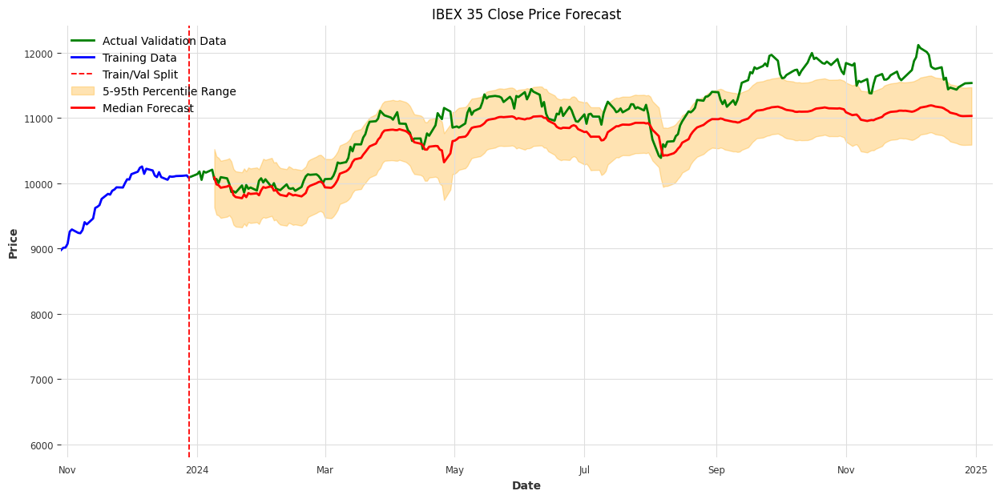


Metrics for IBEX 35:
MAPE: 3.05%
SMAPE: 3.12%
MAE: 347.1247
R2 Score: 0.5307
RMSE: 412.1200
Directional Accuracy: 49.01%


In [ ]:
import matplotlib.pyplot as plt
from darts import concatenate
from darts.metrics import mape, smape, mae, r2_score, rmse
import numpy as np # Import numpy

scaler = RobustScaler()
scaler = Scaler(scaler)
# Fit the scaler on the target variable of the training series
scaler_target = scaler.fit(train_series['ibex_close'])

try:
    forecast_unscaled = scaler_target.inverse_transform(forecast)

    low_quantile_series = forecast_unscaled['ibex_close_q0.05']
    high_quantile_series = forecast_unscaled['ibex_close_q0.95']
    median_series = forecast_unscaled['ibex_close_q0.50']


    # --- Plotting ---
    plt.figure(figsize=(15, 7))

    # Plot the actual validation data (unscaled target)
    # We need to unscale the validation target before plotting for comparison
    val_target_unscaled =  scaler_target.inverse_transform(val['ibex_close'])
    val_target_unscaled.plot(label="Actual Validation Data", color='green')

    # Plot the training data (unscaled target) - for context
    # We need to unscale the training target before plotting
    train_target_unscaled =  scaler_target.inverse_transform(train['ibex_close'])
    train_target_unscaled.plot(label="Training Data", color='blue')


    # Plot vertical line for the train/validation split
    plt.axvline(x=train.end_time(), color='red', linestyle='--', label='Train/Val Split')


    # Plot the selected quantile range (5th and 95th percentiles)
    plt.fill_between(
        low_quantile_series.time_index,
        low_quantile_series.univariate_values(),
        high_quantile_series.univariate_values(),
        color='orange',
        alpha=0.3,
        label='5-95th Percentile Range'
    )

    # Plot the median forecast (50th percentile)
    median_series.plot(label='Median Forecast', color='red')

    # Adjust the x-axis range to focus on the validation period and a bit of the training
    plt.xlim([train.end_time() - pd.Timedelta(days=60), val.end_time() + pd.Timedelta(days=10)]) # Show last 60 days of training

    # Customize the plot's appearance
    plt.title('IBEX 35 Close Price Forecast')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend(loc='upper left')
    plt.grid(True)
    plt.show()

    # --- Calculate Error Metrics ---

    # Get the actual values for the period where forecasts exist
    # Ensure both series cover the same time range
    common_dates = median_series.time_index.intersection(val_target_unscaled.time_index)
    actual = val_target_unscaled.slice(common_dates[0], common_dates[-1])
    # Use the median forecast for metric calculation
    pred = median_series.slice(common_dates[0], common_dates[-1])

    print("\nMetrics for IBEX 35:")
    print(f"MAPE: {mape(actual, pred):.2f}%")
    print(f"SMAPE: {smape(actual, pred):.2f}%")
    print(f"MAE: {mae(actual, pred):.4f}")
    print(f"R2 Score: {r2_score(actual, pred):.4f}")
    print(f"RMSE: {rmse(actual, pred):.4f}")


    # --- Directional Accuracy ---
    actual_diff = actual.diff().drop_before(actual.start_time() + actual.freq)
    pred_diff = pred.diff().drop_before(pred.start_time() + pred.freq)

    # Align again just in case
    actual_diff, pred_diff = actual_diff.slice_intersect(pred_diff), pred_diff.slice_intersect(actual_diff)
    dir_acc = (np.sign(actual_diff.values()) == np.sign(pred_diff.values())).mean() * 100
    print(f"Directional Accuracy: {dir_acc:.2f}%")

except KeyError as e:
    print(f"Error: Could not find expected component in forecast. Please check 'forecast.components' output above.")
    print(f"Details: {e}")

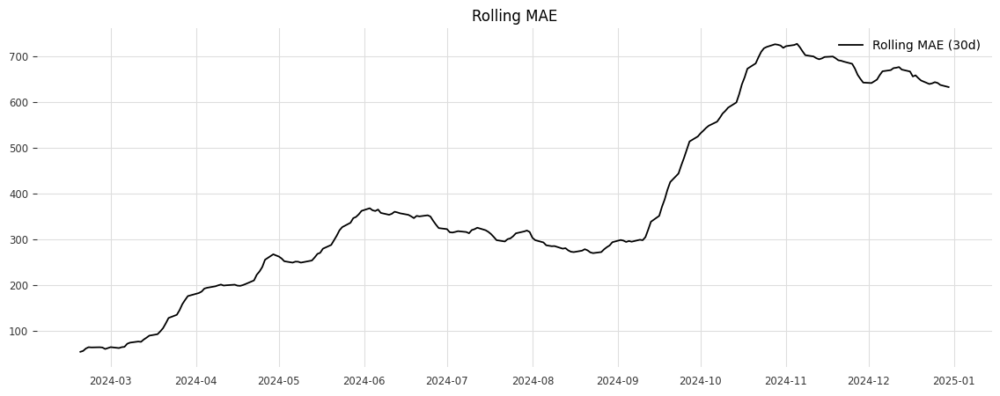

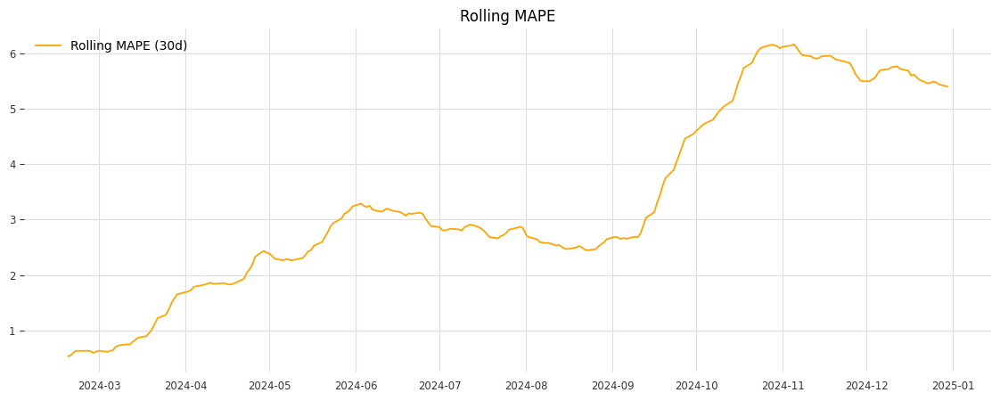

In [ ]:
#Rolling MAE & MAPE
window = 30
actual_pd = pd.Series(actual.values().flatten(), index=actual.time_index)
pred_pd = pd.Series(pred.values().flatten(), index=pred.time_index)

rolling_mae = (actual_pd - pred_pd).abs().rolling(window).mean()
rolling_mape = ((actual_pd - pred_pd).abs() / actual_pd).rolling(window).mean() * 100

plt.figure(figsize=(14, 5))
plt.plot(rolling_mae, label="Rolling MAE (30d)")
plt.title("Rolling MAE")
plt.grid(True)
plt.legend()
plt.show()

plt.figure(figsize=(14, 5))
plt.plot(rolling_mape, label="Rolling MAPE (30d)", color="orange")
plt.title("Rolling MAPE")
plt.grid(True)
plt.legend()
plt.show()


In [ ]:
print(train.components)
print(forecast.components)

Index(['close_acs', 'close_acx', 'close_aena', 'close_ams', 'close_ana',
       'close_ane', 'close_bbva', 'close_bkt', 'close_cabk', 'close_clnx',
       ...
       'day_of_week', 'month', 'quarter', 'year', 'trading_day',
       'ibex_close_returns', 'ibex_log_returns', 'ibex_volatility',
       'ibex_close_momentum', 'ibex_trading_volume_ma'],
      dtype='object', name='component', length=406)
Index(['ibex_close_q0.01', 'ibex_close_q0.05', 'ibex_close_q0.10',
       'ibex_close_q0.15', 'ibex_close_q0.20', 'ibex_close_q0.25',
       'ibex_close_q0.30', 'ibex_close_q0.40', 'ibex_close_q0.50',
       'ibex_close_q0.60', 'ibex_close_q0.70', 'ibex_close_q0.75',
       'ibex_close_q0.80', 'ibex_close_q0.85', 'ibex_close_q0.90',
       'ibex_close_q0.95', 'ibex_close_q0.99'],
      dtype='object', name='component')


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

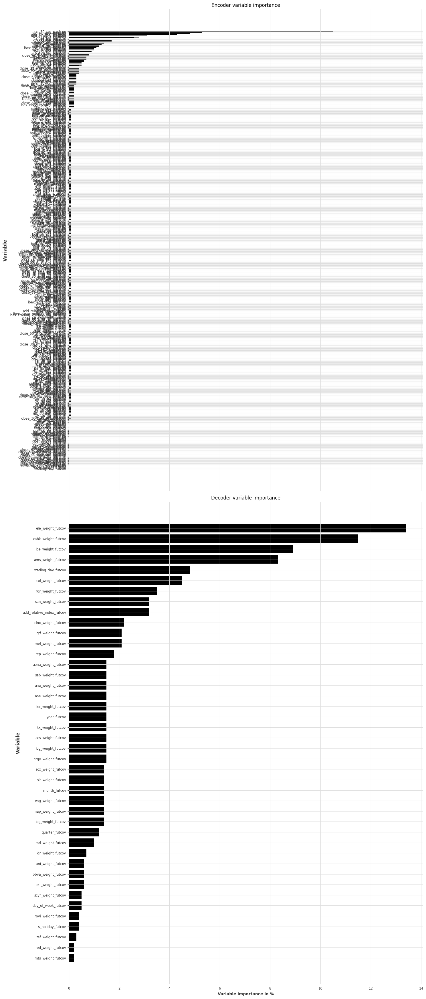

In [ ]:
from darts.explainability import TFTExplainer
explainer = TFTExplainer(model=my_model,
                         background_series=train['ibex_close'],
                         background_past_covariates=darts_series[past_covariate_cols],
                         background_future_covariates=darts_series[known_future_inputs])
explainability_result = explainer.explain()
explainer.plot_variable_selection(explainability_result, fig_size=(15, 35))



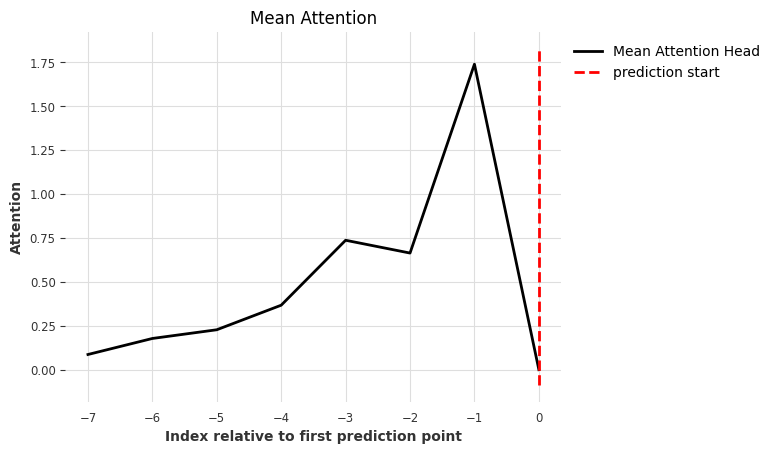

<Axes: title={'center': 'Mean Attention'}, xlabel='Index relative to first prediction point', ylabel='Attention'>

In [ ]:
explainer.plot_attention(explainability_result, plot_type="time")


In [ ]:
explainability_result.get_encoder_importance()


,trading_day_futcov,acs_weight_futcov,aena_weight_futcov,close_60_sma_sab_pastcov,close_60_sma_ibex_pastcov,close_60_sma_itx_pastcov,close_60_sma_mel_pastcov,close_60_sma_mrl_pastcov,close_60_sma_mts_pastcov,close_60_sma_red_pastcov,close_60_sma_rep_pastcov,close_60_sma_aena_pastcov,close_30_sma_itx_pastcov,close_30_sma_mts_pastcov,close_30_sma_rep_pastcov,close_30_sma_acx_pastcov,close_30_sma_bbva_pastcov,close_30_sma_bkt_pastcov,close_30_sma_eng_pastcov,volume_bkt_pastcov,dx_30_sab_pastcov,dx_30_cabk_pastcov,cci_30_sab_pastcov,cci_30_tef_pastcov,cci_30_ibex_pastcov,cci_30_acs_pastcov,cci_30_ams_pastcov,rsi_30_idr_pastcov,rsi_30_ele_pastcov,boll_lb_rep_pastcov,boll_lb_eng_pastcov,boll_ub_red_pastcov,volume_log_pastcov,volume_mel_pastcov,boll_ub_ibe_pastcov,boll_ub_idr_pastcov,boll_ub_itx_pastcov,macd_col_pastcov,macd_ele_pastcov,macd_eng_pastcov,macd_iag_pastcov,macd_ibe_pastcov,volume_slr_pastcov,close_acs_pastcov,close_fdr_pastcov,col_weight_futcov,cci_30_scyr_pastcov,close_30_sma_acs_pastcov,dx_30_uni_pastcov,dx_30_tef_pastcov,dx_30_slr_pastcov,dx_30_scyr_pastcov,dx_30_san_pastcov,dx_30_rovi_pastcov,dx_30_rep_pastcov,cci_30_slr_pastcov,dx_30_ane_pastcov,cci_30_san_pastcov,cci_30_rovi_pastcov,cci_30_red_pastcov,dx_30_log_pastcov,dx_30_itx_pastcov,dx_30_idr_pastcov,dx_30_iag_pastcov,dx_30_grf_pastcov,dx_30_fer_pastcov,volume_col_pastcov,close_30_sma_cabk_pastcov,close_30_sma_ana_pastcov,close_30_sma_ams_pastcov,dx_30_red_pastcov,dx_30_ntgy_pastcov,dx_30_mts_pastcov,dx_30_mrl_pastcov,dx_30_map_pastcov,volume_ele_pastcov,cci_30_itx_pastcov,volume_cabk_pastcov,volume_bbva_pastcov,volume_aena_pastcov,volume_acx_pastcov,dx_30_eng_pastcov,dx_30_ele_pastcov,dx_30_col_pastcov,dx_30_clnx_pastcov,dx_30_bkt_pastcov,rsi_30_itx_pastcov,cci_30_mrl_pastcov,cci_30_map_pastcov,cci_30_log_pastcov,rsi_30_red_pastcov,rsi_30_ntgy_pastcov,rsi_30_mts_pastcov,rsi_30_mrl_pastcov,rsi_30_mel_pastcov,rsi_30_map_pastcov,acx_weight_futcov,rsi_30_ibe_pastcov,rsi_30_iag_pastcov,rsi_30_grf_pastcov,rsi_30_fer_pastcov,rsi_30_fdr_pastcov,cci_30_cabk_pastcov,cci_30_bkt_pastcov,cci_30_bbva_pastcov,rsi_30_clnx_pastcov,dx_30_acx_pastcov,cci_30_idr_pastcov,cci_30_ibe_pastcov,cci_30_grf_pastcov,cci_30_fdr_pastcov,cci_30_ele_pastcov,cci_30_col_pastcov,cci_30_clnx_pastcov,dx_30_ana_pastcov,dx_30_ams_pastcov,close_30_sma_clnx_pastcov,dx_30_acs_pastcov,cci_30_ane_pastcov,cci_30_acx_pastcov,rsi_30_ibex_pastcov,rsi_30_tef_pastcov,rsi_30_slr_pastcov,rsi_30_scyr_pastcov,rsi_30_sab_pastcov,san_weight_futcov,close_60_sma_scyr_pastcov,iag_weight_futcov,cabk_weight_futcov,ams_weight_futcov,fer_weight_futcov,tef_weight_futcov,ibe_weight_futcov,rep_weight_futcov,itx_weight_futcov,close_60_sma_slr_pastcov,close_60_sma_log_pastcov,close_60_sma_idr_pastcov,close_60_sma_iag_pastcov,close_60_sma_fer_pastcov,close_60_sma_fdr_pastcov,day_of_week_futcov,is_holiday_futcov,ibex_trading_volume_ma_pastcov,ibex_close_momentum_pastcov,close_sab_pastcov,ibex_close_target,add_relative_index_futcov,mel_weight_futcov,slr_weight_futcov,rovi_weight_futcov,scyr_weight_futcov,close_iag_pastcov,quarter_futcov,close_san_pastcov,ibex_volatility_pastcov,close_rovi_pastcov,close_mts_pastcov,close_mrl_pastcov,close_mel_pastcov,close_map_pastcov,close_itx_pastcov,close_idr_pastcov,year_futcov,close_60_sma_uni_pastcov,volume_acs_pastcov,close_30_sma_red_pastcov,close_30_sma_ntgy_pastcov,close_30_sma_mrl_pastcov,close_30_sma_mel_pastcov,close_30_sma_map_pastcov,close_30_sma_idr_pastcov,close_30_sma_ibe_pastcov,close_60_sma_eng_pastcov,close_60_sma_ele_pastcov,close_30_sma_sab_pastcov,close_uni_pastcov,close_tef_pastcov,close_slr_pastcov,close_30_sma_iag_pastcov,close_30_sma_grf_pastcov,close_30_sma_fer_pastcov,close_30_sma_fdr_pastcov,close_30_sma_ele_pastcov,close_30_sma_col_pastcov,close_30_sma_ibex_pastcov,ibex_volume_pastcov,close_60_sma_clnx_pastcov,close_60_sma_cabk_pastcov,close_60_sma_bkt_pastcov,close_60_sma_bbva_pastcov,close_60_sma_ana_pastcov,close_60_sma_ams_pastcov,close_60_sma_acx_pastcov,close_

In [ ]:
explainability_result.get_decoder_importance()


,mts_weight_futcov,red_weight_futcov,tef_weight_futcov,is_holiday_futcov,rovi_weight_futcov,day_of_week_futcov,scyr_weight_futcov,bkt_weight_futcov,bbva_weight_futcov,uni_weight_futcov,idr_weight_futcov,mrl_weight_futcov,quarter_futcov,iag_weight_futcov,map_weight_futcov,eng_weight_futcov,month_futcov,slr_weight_futcov,acx_weight_futcov,ntgy_weight_futcov,log_weight_futcov,acs_weight_futcov,itx_weight_futcov,year_futcov,fer_weight_futcov,ane_weight_futcov,ana_weight_futcov,sab_weight_futcov,aena_weight_futcov,rep_weight_futcov,mel_weight_futcov,grf_weight_futcov,clnx_weight_futcov,add_relative_index_futcov,san_weight_futcov,fdr_weight_futcov,col_weight_futcov,trading_day_futcov,ams_weight_futcov,ibe_weight_futcov,cabk_weight_futcov,ele_weight_futcov
0,0.2,0.2,0.3,0.4,0.4,0.5,0.5,0.6,0.6,0.6,0.7,1.0,1.2,1.4,1.4,1.4,1.4,1.4,1.4,1.5,1.5,1.5,1.5,1.5,1.5,1.5,1.5,1.5,1.5,1.8,2.1,2.1,2.2,3.2,3.2,3.5,4.5,4.8,8.299999,8.900001,11.5,13.400001


In [ ]:
explainability_result.get_static_covariates_importance()


""


In [ ]:
from darts.metrics import mape, smape, mae

forecast = my_model.historical_forecasts(
    series=val_target,
    past_covariates=val_past_cov,
    future_covariates=val_future_cov,
    #start=0.05,  # Start earlier in the validation set
    forecast_horizon=1,
    predict_likelihood_parameters= True, # Reduce forecast horizon
    stride=1,
    retrain=False,
    num_samples=1,  # Explicitly set number of samples
    verbose=True
)

# Print forecast details
print(f"Forecast shape: {forecast.values().shape}")
print(f"Time range: {forecast.start_time()} to {forecast.end_time()}")
print(f"Contains NaN: {np.isnan(forecast.values()).any()}")
if np.isnan(forecast.values()).any():
    print("First few values:", forecast.values()[:5])


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

Forecast shape: (255, 17)
Time range: 2024-01-09 00:00:00 to 2024-12-30 00:00:00
Contains NaN: False
